In [1]:
import numpy as np
import pandas as pd
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib
from matplotlib import rc

In [2]:
st_bursts = pd.read_csv("/home/NETID/lundvm/data/spatiotempAvalsFinal.csv", names = ['start_time', 'end_time', 'spike_count'], header=None)
temp_bursts = pd.read_csv("/home/NETID/lundvm/data/tR_1.0--fE_0.90/allAvalBurst.csv")
temp_bursts = temp_bursts.drop(['ID','StartRow', 'EndRow', 'Width'], axis = 1)

In [3]:
temp_bursts.head(10)

,StartT,EndT,TotalSpikes,IBI
0,96710760,96714577,36099,1051
1,97005292,97007886,31500,290715
2,97103272,97104966,32318,95386
3,97612380,97614895,29529,507414
4,97871054,97873590,31009,256159
5,98438061,98440202,32766,564471
6,98494594,98496625,33108,54392
7,98545483,98547374,32204,48858
8,98701418,98704037,32997,154044
9,99658098,99660607,33007,954061


In [4]:
print("Temporal Bursts:")
print("Total count: " + str(temp_bursts.shape[0]))
print("Total spikes: " + str(np.sum(temp_bursts['TotalSpikes'].values)))
print("Spikes not included: " + str(430128718 - np.sum(temp_bursts['TotalSpikes'].values)))
print("Burst min length: " + str(np.min(temp_bursts['TotalSpikes'].values)) + " spikes")
print("Burst max length: " + str(np.max(temp_bursts['TotalSpikes'].values)) + " spikes")

Temporal Bursts:
Total count: 9729
Total spikes: 426908591
Spikes not included: 3220127
Burst min length: 29529 spikes
Burst max length: 53503 spikes


In [5]:
st_bursts.head(10)

,start_time,end_time,spike_count
0,96709709,96717133,41828
1,97004816,97008360,33957
2,97103069,97105376,33628
3,97611741,97615512,33429
4,97870785,97874257,33533
5,98437786,98440594,33930
6,98494406,98496972,33831
7,98545234,98547910,33882
8,98701135,98704277,33901
9,99657788,99660896,34133


In [6]:
print("Spatiotemporal Bursts:")
print("Total count: " + str(st_bursts.shape[0]))
print("Total spikes: " + str(np.sum(st_bursts['spike_count'].values)))
print("Spikes not included: " + str(430128718 - np.sum(st_bursts['spike_count'].values)))
print("Burst min length: " + str(np.min(st_bursts['spike_count'].values)) + " spikes")
print("Burst max length: " + str(np.max(st_bursts['spike_count'].values)) + " spikes")
print("Burst max length: " + str(np.max(st_bursts['spike_count'].values)) + " spikes")

Spatiotemporal Bursts:
Total count: 9790
Total spikes: 430125654
Spikes not included: 3064
Burst min length: 2 spikes
Burst max length: 105938 spikes
Burst max length: 105938 spikes


In [7]:
large_st_bursts = st_bursts[st_bursts['spike_count'] > 29529]
print("Spatiotemporal Bursts > 29529 spikes:")
print("Total count: " + str(large_st_bursts.shape[0]))
print("Total spikes: " + str(np.sum(large_st_bursts['spike_count'].values)))
print("Spikes not included: " + str(430128718 - np.sum(large_st_bursts['spike_count'].values)))
print("Burst min length: " + str(np.min(large_st_bursts['spike_count'].values)) + " spikes")
print("Burst max length: " + str(np.max(large_st_bursts['spike_count'].values)) + " spikes")
print("Bursts > 60000: " + str(large_st_bursts[large_st_bursts['spike_count'] > 60000].shape[0]))

Spatiotemporal Bursts > 29529 spikes:
Total count: 9670
Total spikes: 430125378
Spikes not included: 3340
Burst min length: 33134 spikes
Burst max length: 105938 spikes
Bursts > 60000: 59


In [8]:
spikes = pd.read_csv("/home/NETID/lundvm/data/spikes.csv")

In [9]:
largest_st_bursts = large_st_bursts[large_st_bursts['spike_count'] > 60000]
largest_st_bursts.head()

,start_time,end_time,spike_count
33,102329823,102400660,69475
219,111906106,111958965,71703
380,119546942,119629249,72387
436,122195327,122238447,72904
437,122284683,122333959,72839


In [10]:
b = spikes[(spikes['time_step'] >= 102329823) & (spikes['time_step'] <= 102400660)]

In [11]:
burst_data = b['xloc'].groupby([b.time_step]).apply(list).reset_index()
temp = b['yloc'].groupby([b.time_step]).apply(list).reset_index()
burst_data['yloc'] = temp['yloc']

In [12]:
burst_data.head()

,time_step,xloc,yloc
0,102329823,[87],[2]
1,102329825,[97],[60]
2,102329836,[87],[29]
3,102329843,[88],[3]
4,102329844,[86],[3]


In [13]:
burst_data['xloc'].values[0]

[87]

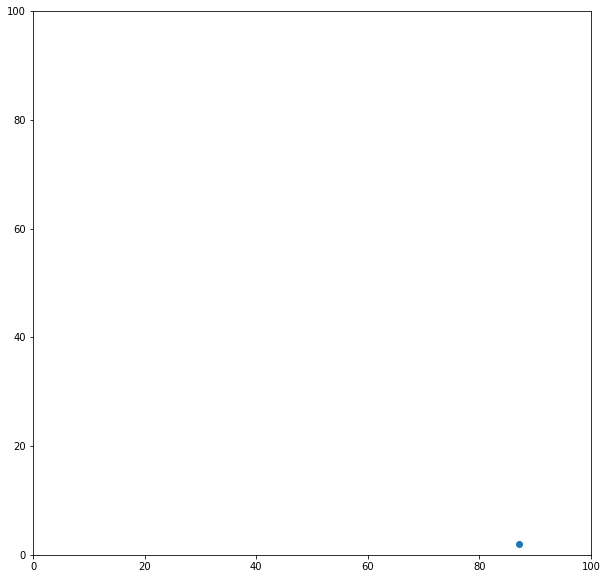

In [14]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set(xlim=(0, 100), ylim=(0, 100))
scat = ax.scatter(burst_data['xloc'].values[0], burst_data['yloc'].values[0])

In [15]:
def animate(i):
    y_i = burst_data['yloc'].values[i]
    x_i = burst_data['xloc'].values[i]
    scat.set_offsets(np.c_[x_i, y_i])
    return (scat,)

In [16]:
anim = FuncAnimation(fig, animate, frames=burst_data.shape[0], interval=20, blit=True)

In [17]:
HTML(anim.to_html5_video())

In [18]:
#anim.save('/home/NETID/lundvm/data/merged_burst_nonstarter.mp4')

In [19]:
b1 = spikes[(spikes['time_step'] >= 103469362) & (spikes['time_step'] <= 103516788)]
burst_data1 = b1['xloc'].groupby([b1.time_step]).apply(list).reset_index()
temp1 = b1['yloc'].groupby([b1.time_step]).apply(list).reset_index()
burst_data1['yloc'] = temp1['yloc']

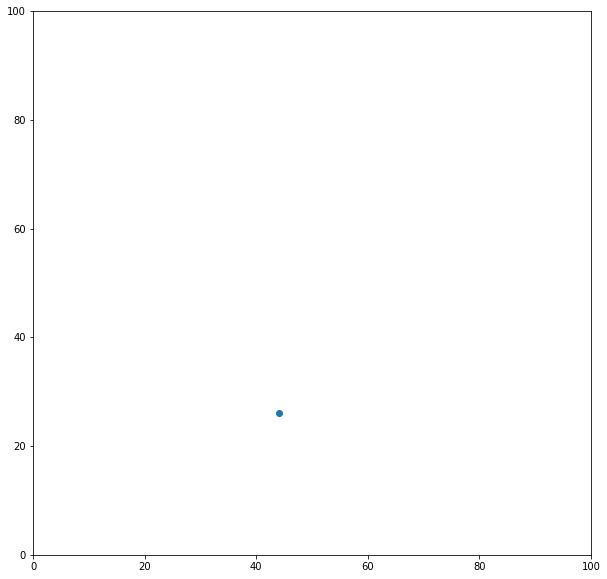

In [20]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set(xlim=(0, 100), ylim=(0, 100))
scat = ax.scatter(burst_data1['xloc'].values[0], burst_data1['yloc'].values[0])

In [21]:
def animate(i):
    y_i = burst_data1['yloc'].values[i]
    x_i = burst_data1['xloc'].values[i]
    scat.set_offsets(np.c_[x_i, y_i])
    return (scat,)

In [22]:
anim = FuncAnimation(fig, animate, frames=burst_data1.shape[0], interval=30, blit=True)

In [23]:
HTML(anim.to_html5_video())

In [24]:
#anim.save('/home/NETID/lundvm/data/nonmerged_burst_nonstarter.mp4')

In [40]:
b.to_csv('/home/NETID/lundvm/data/b_withstarters.csv')

In [7]:
tempb1 = pd.read_csv('/home/NETID/lundvm/data/b_withstarters.csv')
tempb = pd.read_csv('/home/NETID/lundvm/data/b.csv')

In [53]:
tempb = tempb.append(tempb1)

In [54]:
tempb = tempb.drop(tempb.columns[0], axis = 1)
tempb = tempb.drop_duplicates(keep=False)

In [57]:
tempb.to_csv('/home/NETID/lundvm/data/starters.csv')

In [9]:
tempb['next_ts'] = tempb['time_step'].shift(-1)

tempb

In [11]:
tempb["diff"] = tempb['next_ts'] - tempb['time_step']

In [17]:
tempb.dropna()

,Unnamed: 0,time_step,xloc,yloc,next_ts,diff
0,1105084,102329823,87,2,102329843.0,20.0
1,1105085,102329843,88,3,102329844.0,1.0
2,1105086,102329844,86,3,102329849.0,5.0
3,1105087,102329849,87,4,102329851.0,2.0
4,1105088,102329851,86,2,102329863.0,12.0
5,1105089,102329863,87,1,102329866.0,3.0
6,1105090,102329866,88,4,102329868.0,2.0
7,1105091,102329868,86,4,102329871.0,3.0
8,1105092,102329871,86,1,102329872.0,1.0
9,1105093,102329872,85,3,102329873.0,1.0


In [21]:
tempb.describe()

,Unnamed: 0,time_step,xloc,yloc,next_ts,diff
count,6.947500e+04,6.947500e+04,69475.000000,69475.000000,6.947400e+04,69474.000000
mean,1.139821e+06,1.023655e+08,49.425650,49.483829,1.023655e+08,1.019619
std,2.005585e+04,3.366443e+04,28.689042,28.729634,3.366440e+04,241.692013
min,1.105084e+06,1.023298e+08,0.000000,0.000000,1.023298e+08,0.000000
25%,1.122452e+06,1.023317e+08,25.000000,25.000000,1.023317e+08,0.000000
50%,1.139821e+06,1.023972e+08,49.000000,49.000000,1.023972e+08,0.000000
75%,1.157190e+06,1.023990e+08,74.000000,74.000000,1.023990e+08,0.000000
max,1.174558e+06,1.024007e+08,99.000000,99.000000,1.024007e+08,63705.000000


In [24]:
tempb['diff'].idxmax()

34524